<a href="https://colab.research.google.com/github/Metodoscomputacionales1/Metodos1_PedroAngarita_SimonUribe/blob/main/Tarea5/punto_mas_cercano.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:

b1 = lambda x: 2*x - 2
b2 = lambda x: 0.5*(x - 1)
b3 = lambda x: x - 4

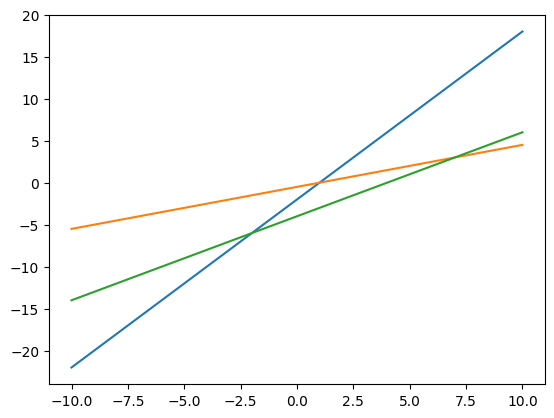

In [11]:
b1 = lambda x: 2*x - 2
b2 = lambda x: 0.5*(x - 1)
b3 = lambda x: x - 4

xs = np.linspace(-10, 10, 100)
plt.plot(xs, b1(xs))
plt.plot(xs, b2(xs))
plt.plot(xs, b3(xs))
plt.show()

In [12]:
A=np.array([[2,-1],[1,2],[1,1]])
A
b=np.array([2,1,4])
b

array([2, 1, 4])

In [13]:
b2=np.dot(A.T,b)
b2
ATA=np.dot(A.T,A)
b2


array([9, 4])

In [14]:

def GaussJordan(A_, b_):

  A = A_.copy().astype(float)
  b = b_.copy().astype(float)
  n = A.shape[0]

  for i in range(n):
    for j in range(i+1,n):
      a = A[j,i]/A[i,i]
      A[j,:] -= a*A[i,:]
      b[j] -= a*b[i]


  x = np.zeros_like(b)

  for i in reversed(range(n)):

    x[i] = b[i]

    for j in range(i+1,n):

      x[i] -= A[i,j]*x[j]

    x[i] /= A[i,i]


  return x


In [15]:
sol=GaussJordan(ATA,b2)
sol

array([1.42857143, 0.42857143])

In [27]:
np.shape(sol)

(2,)

In [24]:
len(sol)

2

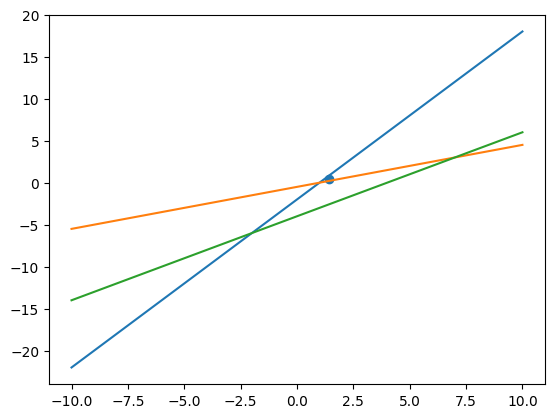

In [20]:
b1 = lambda x: 2*x - 2
b2 = lambda x: 0.5*(x - 1)
b3 = lambda x: x - 4

xs = np.linspace(-10, 10, 100)
plt.plot(xs, b1(xs))
plt.plot(xs, b2(xs))
plt.plot(xs, b3(xs))
plt.scatter(sol[0],sol[1])
plt.show()

In [18]:
def Minimizar(punto):
  return np.linalg.norm(np.dot(A,punto)-b)


In [54]:
np.dot(A,np.array([0,0]))-b

array([-2., -1., -4.])

In [57]:
np.linalg.norm(np.dot(A,np.array([0,0.1]))-b)

4.563503585026321

In [25]:
from re import M
Minimizar(sol)

2.5354627641855494

In [42]:
def gradient(f, x, h=1e-2):
  n=np.shape(x)[0]
  grad=np.zeros(n)
  for i in range(n):
    x_plus=x.copy()
    x_plus[i]+=h
    x_minus=x.copy()
    x_minus[i]-=h
    grad[i]=(f(x_plus)-f(x_minus))/(2*h)
  return grad

In [85]:
gradient(Minimizar,np.array([0,0]))

array([0., 0.])

In [99]:
def newton(p0,epoch,learning=1e-4):
  for i in range(epoch):
    p0=p0-learning*gradient(Minimizar,p0)
  return p0





In [106]:
A=newton(np.array([1,1]),1000)

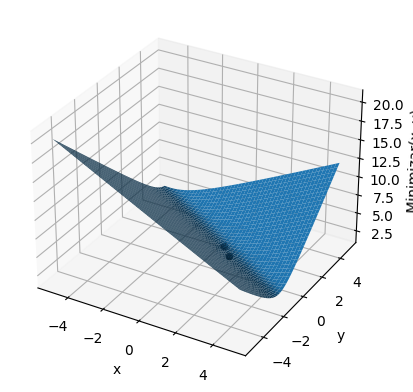

In [110]:
x = np.linspace(-5, 5, 1000)
y = np.linspace(-5, 5, 1000)
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)

for i in range(X.shape[0]):
  for j in range(X.shape[1]):
    Z[i, j] = Minimizar(np.array([X[i, j], Y[i, j]]))


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('Minimizar(x, y)')


ax.scatter(sol[0], sol[1], Minimizar(sol), color='black', marker='o')
ax.scatter(A[0], A[1], Minimizar(sol), color='black', marker='o')

import plotly.graph_objects as go
fig = go.Figure(data=[go.Surface(z=Z)])
fig.update_traces(contours_z=dict(show=True, usecolormap=True,
                                  highlightcolor="limegreen", project_z=True))
fig.show()

In [ ]:
Minimizar(A)

In [108]:
A

array([0.72062862, 1.14022486])

In [105]:
A

array([-3.11052267,  0.41245891])